
## **Predicting Red Wine Quality using Machine Learning**

>

In [3]:
# importing necessary packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
import warnings
warnings.filterwarnings("ignore")



 ## **Reading source file**

In [4]:
df = pd.read_csv('winequality-red.csv') # loading data

In [5]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


##**Data Characterization and Preliminary Analysis**

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


**Understanding the different features of wine, we see that there are a total of 12 columns and 1599 samples including the final quality parameter. Let us try to find out what these columns mean and how doo they contribute in determing the quality of the red wine!**

* Fixed Acidity: are non-volatile acids that do not evaporate readily

* Volatile Acidity: are high acetic acid in wine which leads to an unpleasant vinegar taste

* Citric Acid: acts as a preservative to increase acidity. When in small quantities, adds freshness and flavor to wines

* Residual Sugar: is the amount of sugar remaining after fermentation stops. The key is to have a perfect balance between sweetness and sourness. It is important to note that wines > 45g/ltrs are sweet

* Chlorides: the amount of salt in the wine

* Free Sulfur Dioxide: it prevents microbial growth and the oxidation of wine

* Total Sulfur Dioxide: is the amount of free + bound forms of SO2

* Density: sweeter wines have a higher density

* pH: describes the level of acidity on a scale of 0–14. Most wines are always between 3–4 on the pH scale

* Alcohol: available in small quantities in wines makes the drinkers sociable

* Sulphates: a wine additive that contributes to SO2 levels and acts as an antimicrobial and antioxidant

* Quality: which is the output variable/predictor





In [7]:
df.nunique()

fixed acidity            96
volatile acidity        143
citric acid              80
residual sugar           91
chlorides               153
free sulfur dioxide      60
total sulfur dioxide    144
density                 436
pH                       89
sulphates                96
alcohol                  65
quality                   6
dtype: int64

In [8]:
target='quality'
features = [i for i in df.columns.values]

#Checking number of unique rows in each feature

nu = df[features].nunique().sort_values()
nf = []; cf = []; nnf = 0; ncf = 0; #numerical & categorical features

for i in range(df[features].shape[1]):
    if nu.values[i]<=7:cf.append(nu.index[i])
    else: nf.append(nu.index[i])

print('\n\033[1mInference:\033[0m The Datset has {} numerical & {} categorical features.'.format(len(nf),len(cf)))


Inference: The Datset has 11 numerical & 1 categorical features.


In [9]:
#Checking the stats of all the columns

display(df.describe())

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


# **Observation**
The quality of wine varies from 3 to 8, where 6 is the average quality

The maximum alcohol level in the wine is 14.9 and minimum is 8.4

The pH level of wine varies between 2.74 to 4.01

The average density of wine is 0.9956.

Total sulpher dioxide varies between 6.0 to 289.0

In [10]:
df.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [11]:
df.duplicated().sum()

240

We arent going to drop duplicates because because we are assuming that this survey was made by different unique wine tasters who may have given same ratings.

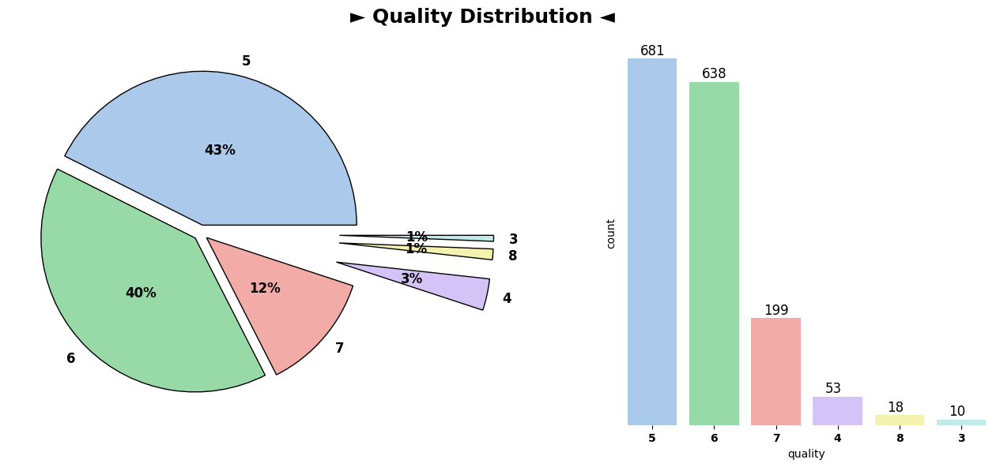

In [12]:
fig, ax = plt.subplots(1,2,figsize=(15, 6), width_ratios=[2,1])

textprops={'fontsize': 12, 'weight': 'bold',"color": "black"}
ax[0].pie(df["quality"].value_counts().to_list(),
        colors=["#abc9ea","#98daa7","#f3aba8","#d3c3f7","#f3f3af","#c0ebe9"],
        labels=df["quality"].value_counts().index.to_list(),
        autopct='%1.f%%',
        explode=([.05]*3 +[.9,.9,.9]),
        pctdistance=0.5,
        wedgeprops={'linewidth' : 1, 'edgecolor' : 'black'},
        textprops=textprops)

sns.countplot(x = "quality", data=df, palette = "pastel6", order=df["quality"].value_counts().to_dict().keys())
for p, count in enumerate(df["quality"].value_counts().to_dict().values(),0):
  ax[1].text(p-0.2, count + 8, count, color='black', fontsize=12)
plt.setp(ax[1].get_xticklabels(), fontweight="bold")
plt.yticks([])
plt.box(False)
fig.suptitle(x=0.56, t=f'► Quality Distribution ◄', fontsize=18, fontweight='bold')
plt.tight_layout()
plt.show()

# **Univariate analysis**

**Histograms**

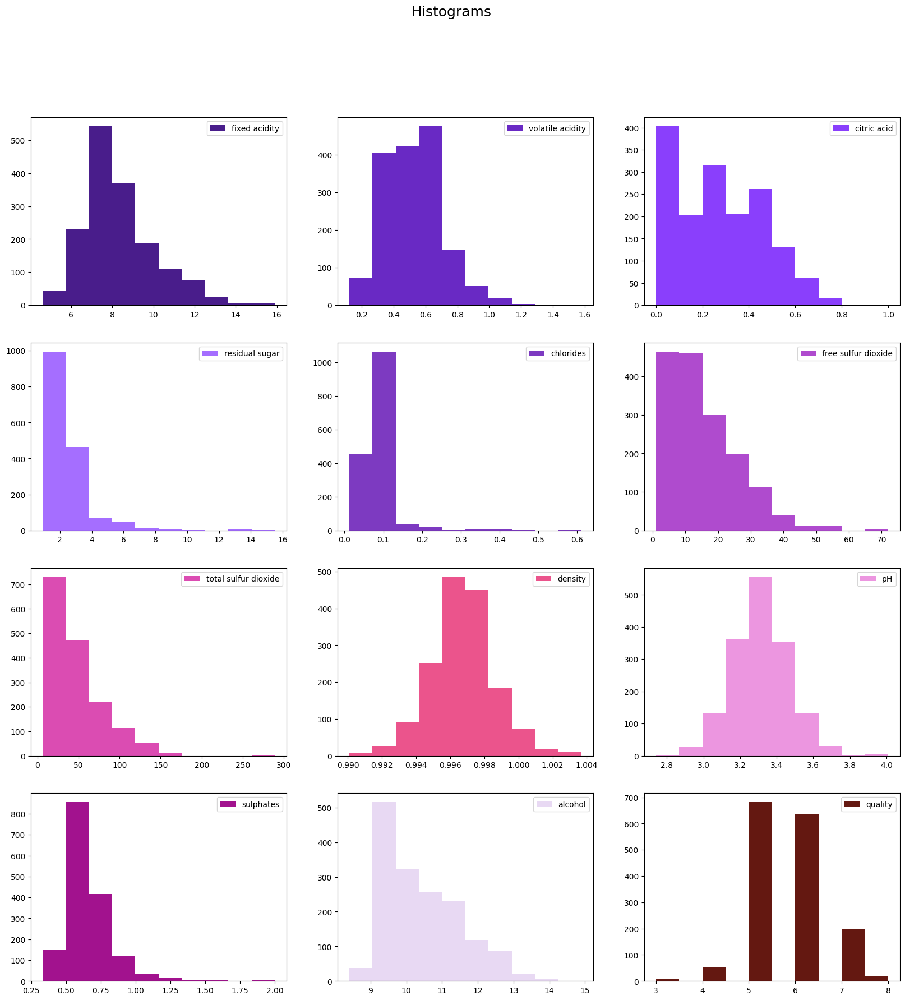

In [13]:
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (20, 20))

colors = ['#491D8B', '#6929C4', '#8A3FFC', '#A56EFF',
          '#7D3AC1', '#AF4BCE', '#DB4CB2', '#EB548C',
          '#EC96E0', '#A2128E', '#E8D9F3', '#641811']

for index, column in enumerate(df.columns):
    ax = axes.flatten()[index]
    ax.hist(df[column], color = colors[index], label = column)
    ax.legend(loc = "best")
plt.suptitle("Histograms", size = 18)

plt.show()

Most of the values ​​of the "fixed_acidity" variable are in the range of 7 - 8;

Most of the values ​​of the "volatile_acidity" variable are in the range of 0.4 - 0.7;

Most values ​​of the "citric_acid" variable are in the range of 0.0 - 0.1;

Most of the values ​​of the "residual_sugar" variable are in the range of 1 - 2.5;

Most of the values ​​of the "chlorides" variable are in the range of 0.085 - 0.15;

Most values ​​of the "free_sulfur_dioxide" variable are in the range 0 - 15;

Most values ​​of the "total_sulfur_dioxide" variable are in the range 0 - 30;

Most of the values ​​of the "density" variable are in the range of 0.996 - 0.998;

Most of the values ​​of the "pH" variable are in the range of 3.2 - 3.4;

Most of the values ​​of the "sulphates" variable are in the range of 0.50 - 0.75;

Most of the values ​​of the "alcohol" variable are in the range of 9 - 10;

Most values ​​of the "quality" variable are 5 and 6

We can also see outliers in some features


**Kernel density fuction to understand the distribution**

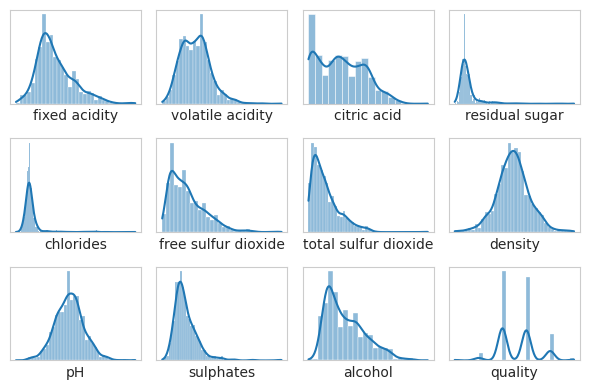

In [14]:
color = sns.color_palette("viridis")
sns.set_style("whitegrid", {'axes.grid' : False})
fig, ax1 = plt.subplots(3,4, figsize=(6,4))
k = 0
columns = list(df.columns)
for i in range(3):
    for j in range(4):

            ax=sns.histplot(x=df[columns[k]],ax=ax1[i][j],kde=True)
            ax.set_ylabel(None); ax.set_yticks([])
            ax.set_xticks([])

            k += 1
plt.tight_layout()
plt.show()

**Most of the features has normal distribution , however we find that some of the features are right-skewed. This will affect our model performance. Hence we adopt Log-normal transformation to make centre skewed**

In [15]:

def log_transform(col):
    return np.log(col[0])

df['residual sugar'] = df[['residual sugar']].apply(log_transform, axis=1)
df['chlorides'] = df[['chlorides']].apply(log_transform, axis=1)
df['free sulfur dioxide'] = df[['free sulfur dioxide']].apply(log_transform, axis=1)
df['total sulfur dioxide'] = df[['total sulfur dioxide']].apply(log_transform, axis=1)
df['sulphates'] = df[['sulphates']].apply(log_transform, axis=1)


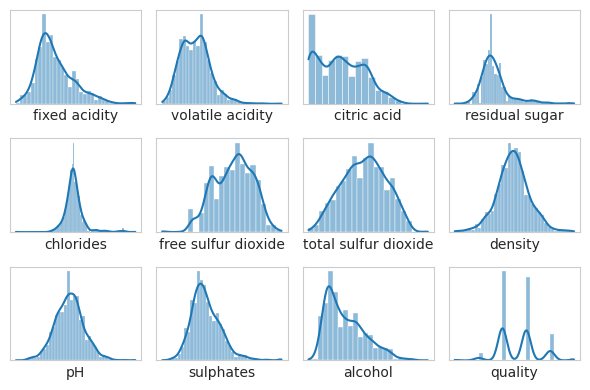

In [16]:
color = sns.color_palette("viridis")
sns.set_style("whitegrid", {'axes.grid' : False})
fig, ax1 = plt.subplots(3,4, figsize=(6,4))
k = 0
columns = list(df.columns)
for i in range(3):
    for j in range(4):

            ax=sns.histplot(x=df[columns[k]],ax=ax1[i][j],kde=True)
            ax.set_ylabel(None); ax.set_yticks([])
            ax.set_xticks([])

            k += 1
plt.tight_layout()
plt.show()

# **Outlier detection using boxplot**

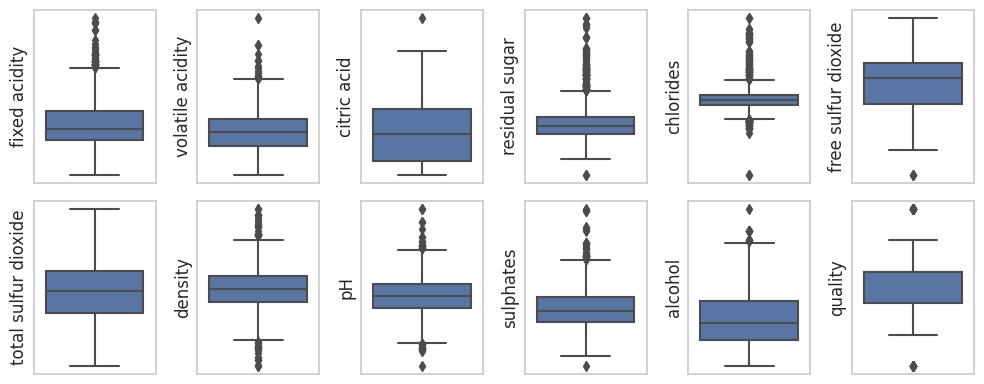

In [17]:
# create box plots
color = sns.color_palette("viridis")
sns.set(font_scale = 1)
sns.set_style("whitegrid", {'axes.grid' : False})
fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(10,4))
index = 0
ax = ax.flatten()

for col, value in df.items():
    a=sns.boxplot(y=col, data=df, color='b', ax=ax[index])
    a.set_yticks([])

    index += 1

plt.tight_layout()

**We find that lots of features has outliers. It can be seen that points outside the whiskers are called outliers. There are different methods to remove them such as Z-score,IQR method, Imputations. Here we will adopt IQR method**

# **Outlier Removal**


In [18]:

df_base= df.copy()
df = df._get_numeric_data()
q1 = df.drop('quality',axis=1).quantile(0.25)
q3 = df.drop('quality',axis=1).quantile(0.75)


iqr = q3 - q1

lower_bound = q1 -(1.5 * iqr)
upper_bound = q3 +(1.5 * iqr)



for col in df.drop(['quality'],axis=1).columns:
    df=df.loc[(df[col]>=lower_bound[col]) & (df[col]<=upper_bound[col])]
    #df[col].loc[(df[col]<lower_bound[col])]=df[col].median()
    #df[col].loc[(df[col]>upper_bound[col])]=df[col].median()

df.reset_index(inplace=True,drop=True)



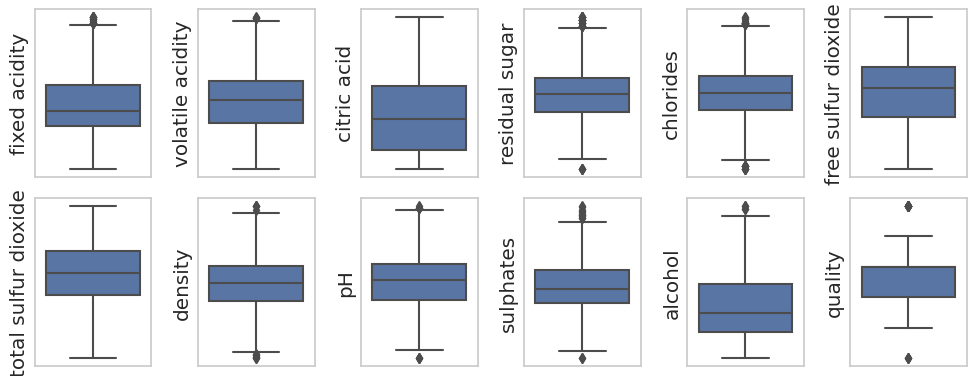

In [19]:
# create box plots to check
color = sns.color_palette("viridis")
sns.set(font_scale = 1.2)
sns.set_style("whitegrid", {'axes.grid' : False})
fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(10,4))
index = 0
ax = ax.flatten()

for col, value in df.items():
    a=sns.boxplot(y=col, data=df, color='b', ax=ax[index])
    a.set_yticks([])

    index += 1

plt.tight_layout()

We could visualize now that outliers are removed

# **Dataset distribution after removal of outliers**

5    561
6    514
7    146
4     35
8     12
3      3
Name: quality, dtype: int64


(1271, 12)

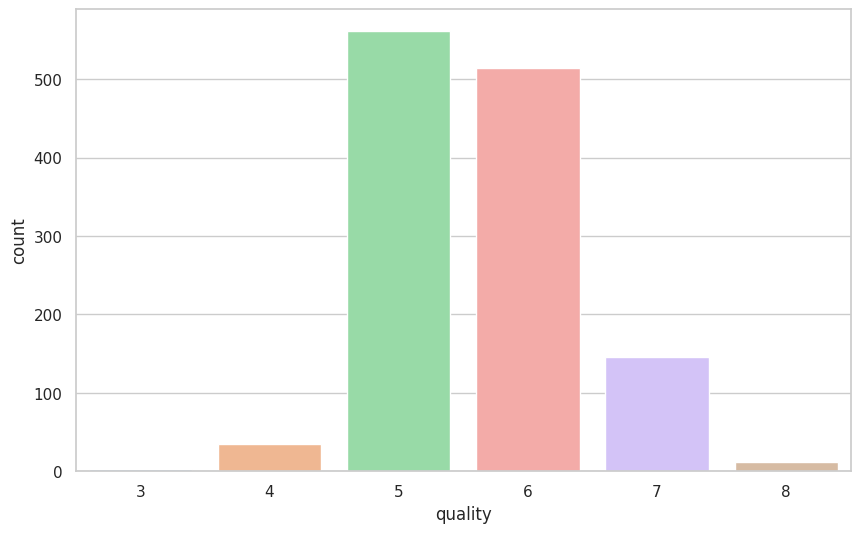

In [20]:
sns.set(style="whitegrid")
print(df['quality'].value_counts())
fig = plt.figure(figsize = (10,6))
sns.countplot(x='quality', data=df, palette='pastel')
df.shape

We can see that about 300 data points were removed

#**Multi-Variate Analysis**

**Pairplots**

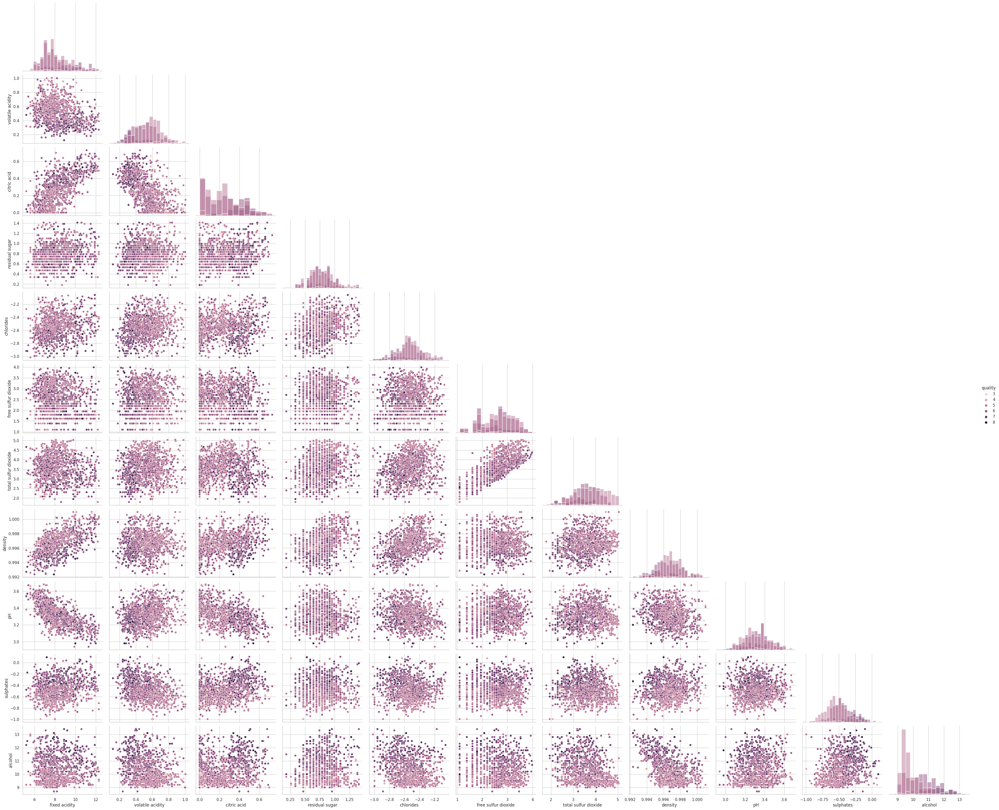

In [21]:
sns.pairplot(df, diag_kind = "hist", hue = "quality", height = 3, aspect = 1.2, corner = True);



It is very difficult to interpret from this plot.So we will look at other multivariate analysis

**Regression plots**

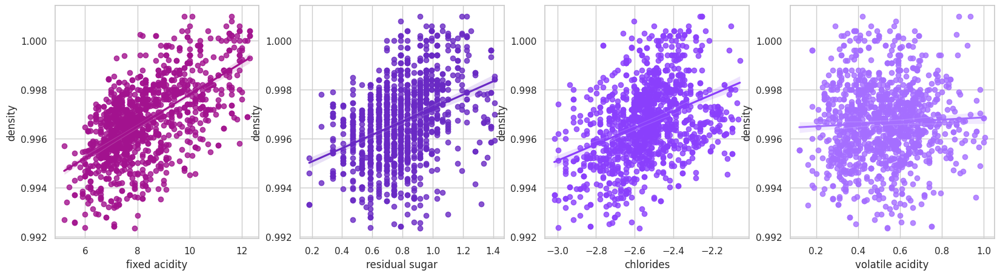

In [22]:
#positive  correlation
fig, axes = plt.subplots(1, 4, figsize = (20, 5))
axes = axes.flatten()

sns.regplot(ax = axes[0], y = "density", x = "fixed acidity", data = df, color = "#A2128E");
sns.regplot(ax = axes[3], y = "density", x = "volatile acidity", data = df, color = "#A56EFF");
sns.regplot(ax = axes[2], y = "density", x = "chlorides", data = df, color = "#8A3FFC");
sns.regplot(ax = axes[1], y = "density", x = "residual sugar", data = df, color = "#6929C4");

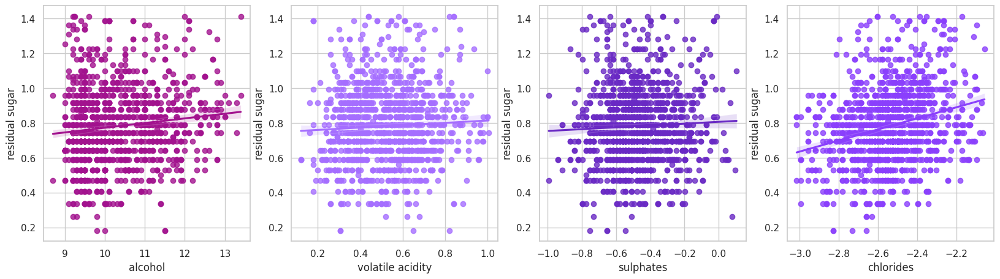

In [23]:
#Zero  correlation
fig, axes = plt.subplots(1, 4, figsize = (20, 5))
axes = axes.flatten()

sns.regplot(ax = axes[0], y = "residual sugar", x = "alcohol", data = df, color = "#A2128E");
sns.regplot(ax = axes[1], y = "residual sugar", x = "volatile acidity", data = df, color = "#A56EFF");
sns.regplot(ax = axes[3], y = "residual sugar", x = "chlorides", data = df, color = "#8A3FFC");
sns.regplot(ax = axes[2], y = "residual sugar", x = "sulphates", data = df, color = "#6929C4");

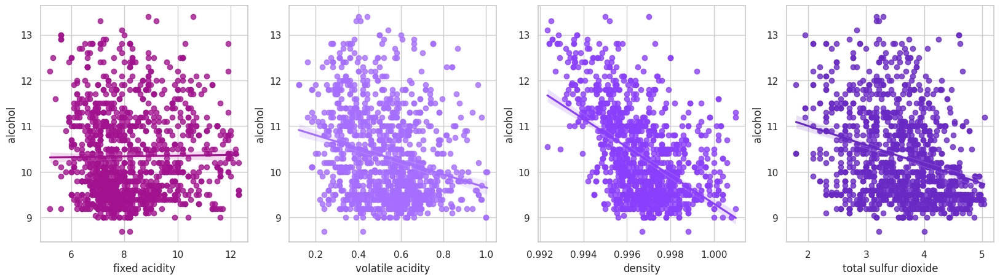

In [24]:
#negative  correlation
fig, axes = plt.subplots(1, 4, figsize = (20, 5))
axes = axes.flatten()

sns.regplot(ax = axes[0], x = "fixed acidity", y = "alcohol", data = df, color = "#A2128E");
sns.regplot(ax = axes[1], x = "volatile acidity", y = "alcohol", data = df, color = "#A56EFF");
sns.regplot(ax = axes[2], x = "density", y = "alcohol", data = df, color = "#8A3FFC");
sns.regplot(ax = axes[3], x = "total sulfur dioxide", y = "alcohol", data = df, color = "#6929C4");

These Plots shows the positive, negative and Zero correlation

# **Feature Importance**
**Correlation Heatmap**

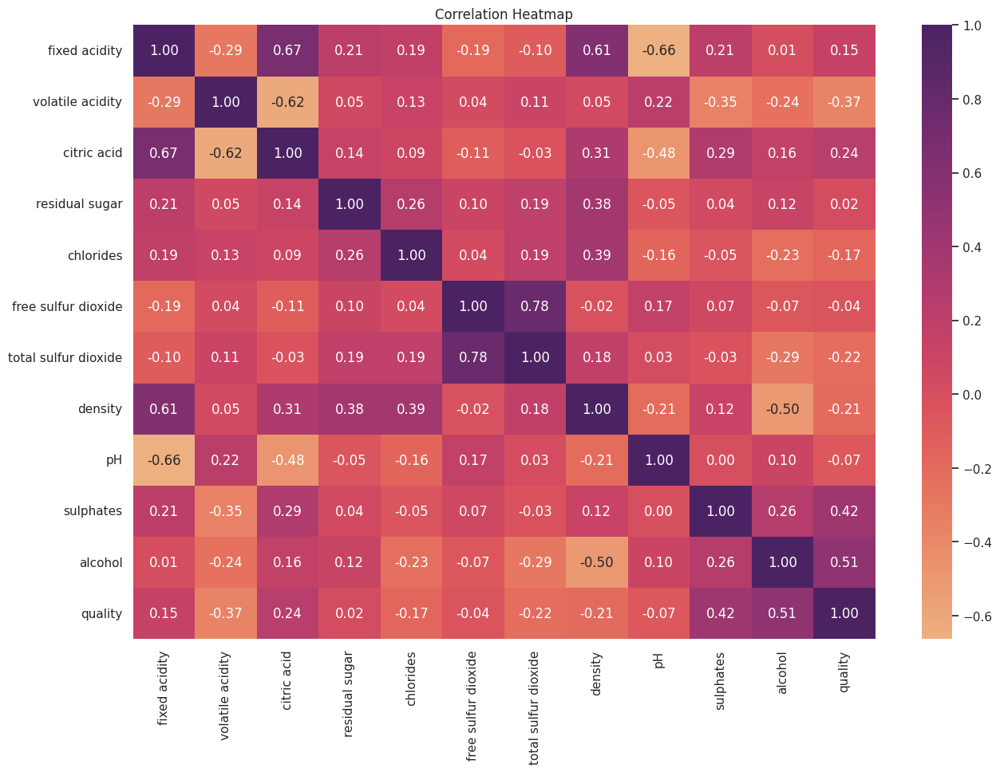

In [25]:
sns.set(font_scale = 1)
correlation_matrix = df.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='flare', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

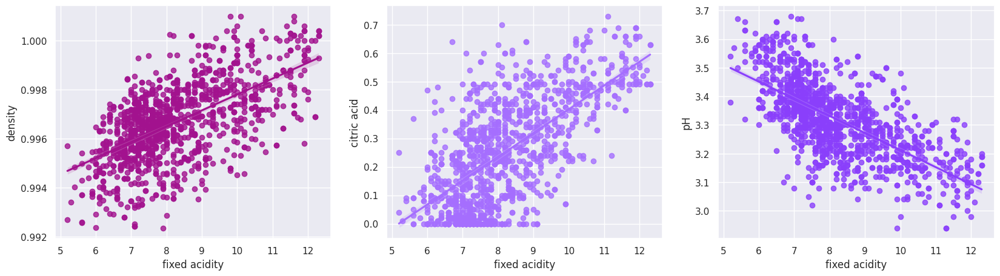

In [ ]:
#positive  correlation
fig, axes = plt.subplots(1, 3, figsize = (20, 5))
axes = axes.flatten()

sns.regplot(ax = axes[0], y = "density", x = "fixed acidity", data = df, color = "#A2128E");
sns.regplot(ax = axes[1], y = "citric acid", x = "fixed acidity", data = df, color = "#A56EFF");
sns.regplot(ax = axes[2], y = "pH", x = "fixed acidity", data = df, color = "#8A3FFC");


We drop features which have have high correlation. this can cause multi-collineairty which generates high variance and cause the model to overfit. As we can see fixed acidity has high correlation with many features, we drop them for our analysis

In [26]:
Evaluation_Results = pd.DataFrame(np.zeros((3,5)), columns=['Accuracy', 'Precision','Recall','F1-score','AUC-ROC score'])
Evaluation_Results.index= ['Logistic Regression (LR)','Support Vector Machine (SVM)','Random Forest Classifier (RF)']
def Classification_Summary(pred,i):
    Evaluation_Results.iloc[i]['Accuracy']=round(accuracy_score(Y_test, pred),3)*100
    Evaluation_Results.iloc[i]['Precision']=round(precision_score(Y_test, pred, average='weighted'),3)*100 #
    Evaluation_Results.iloc[i]['Recall']=round(recall_score(Y_test, pred, average='weighted'),3)*100 #
    Evaluation_Results.iloc[i]['F1-score']=round(f1_score(Y_test, pred, average='weighted'),3)*100 #
    Evaluation_Results.iloc[i]['AUC-ROC score']=round(roc_auc_score(Y_test, clf.predict_proba(X_test), multi_class='ovo'),3)*100 #[:, 1]




# **Principle Component Analysis (PCA)**

In [27]:

def transform_pca(X, n):

    pca = PCA(n_components=n)
    pca.fit(X)
    X_new = pca.inverse_transform(pca.transform(X))

    return X_new

In [28]:
from sklearn.decomposition import PCA
X=df.drop(['quality'],axis=1)
Y=df.quality

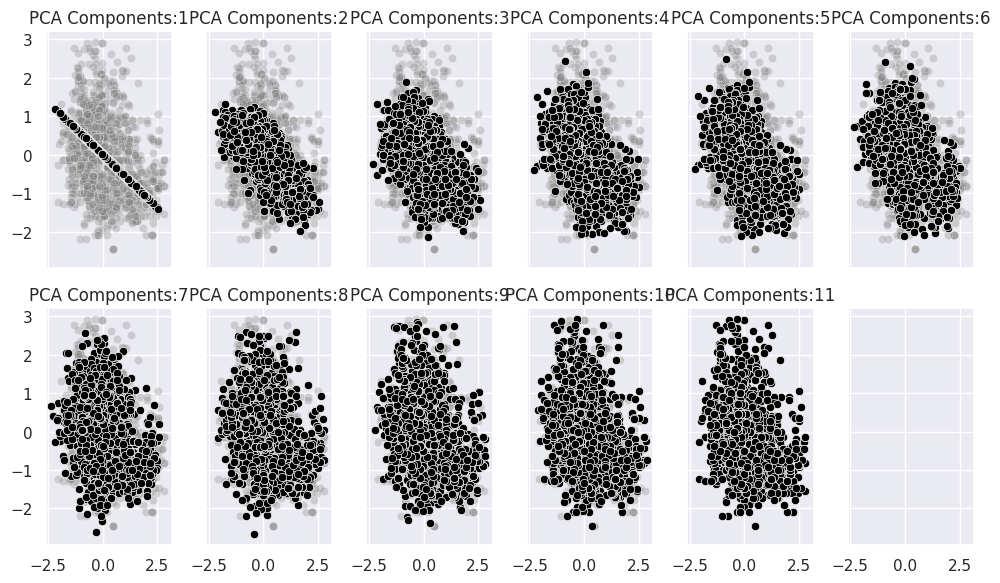

In [29]:
rows =2
cols = 6
comps = 1

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

fig, axes = plt.subplots(rows,
                         cols,
                         figsize=(10,6),
                         sharex=True,
                         sharey=True)
sns.set(font_scale = 1)

for row in range(rows):
    for col in range(cols):
        try:
            X_new = transform_pca(X_scaled, comps)
            ax = sns.scatterplot(x=X_scaled[:, 0],
                                 y=X_scaled[:, 1],
                                 ax=axes[row, col],
                                 color='grey',
                                 alpha=.3)
            ax = sns.scatterplot(x=X_new[:, 0],
                                 y=X_new[:, 1],
                                 ax=axes[row, col],
                                 color='black')
            ax.set_title(f'PCA Components:{comps}');

            comps += 1
        except:
            pass
plt.tight_layout()


We can see that just 8 components are enough explain 95 % variance of the model

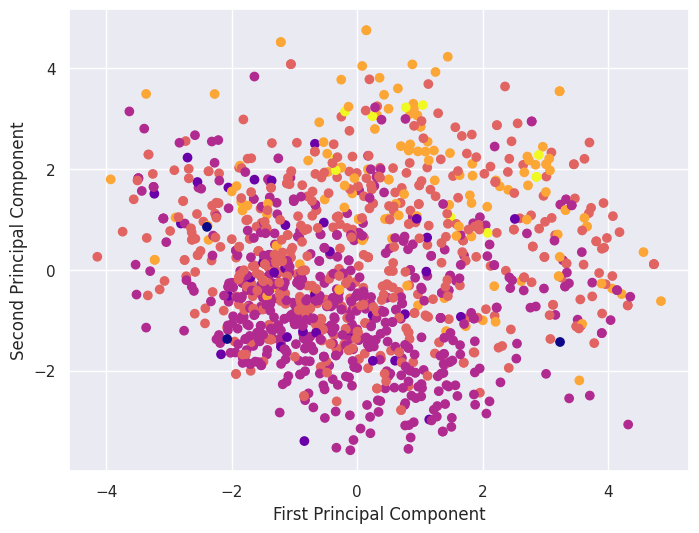

In [30]:
scaler = StandardScaler()
data_rescaled = scaler.fit_transform(X)

x_pca = PCA(8).fit_transform(data_rescaled)
plt.figure(figsize=(8, 6))

plt.scatter(x_pca[:, 0], x_pca[:, 1],
            c=df.quality,
            cmap='plasma')

# labeling x and y axes
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')

plt.show()

Dimensional reduction from 12 features to 2 features using PCA

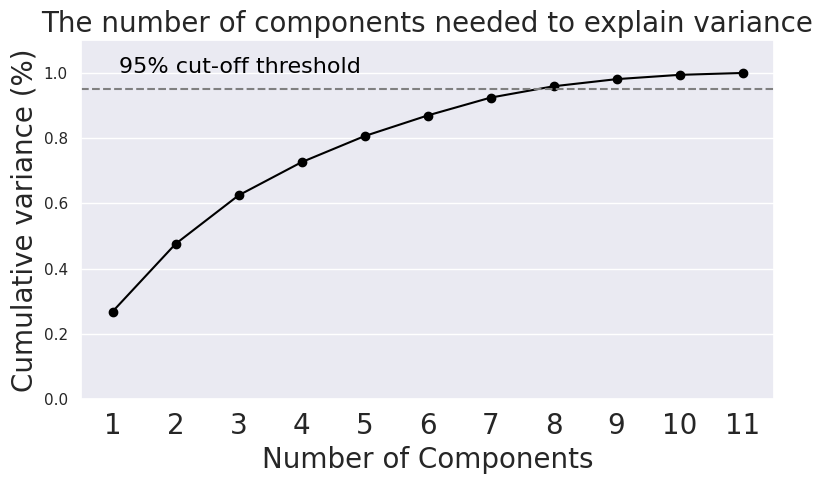

In [31]:

scaler = StandardScaler()
data_rescaled = scaler.fit_transform(X)

pca = PCA().fit(data_rescaled)

plt.rcParams["figure.figsize"] = (8,5)

fig, ax = plt.subplots()
xi = np.arange(1, 12, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='-', color='black')

plt.xlabel('Number of Components',fontsize=20)
plt.xticks(np.arange(1, 12, step=1),fontsize=20)
plt.ylabel('Cumulative variance (%)',fontsize=20)
plt.title('The number of components needed to explain variance',fontsize=20)

plt.axhline(y=0.95, color='grey', linestyle='--')
plt.text(1.1, 1, '95% cut-off threshold', color = 'black', fontsize=16)

ax.grid(axis='x')
plt.tight_layout()

plt.show()


#**Predictive Analysis**
We will be carrying our analysis on logistic regression, SVM and Random forest


In [32]:
# splitting data into training and test set
X =df.drop(['quality','fixed acidity'],axis=1) # Drop Feature fixed acidity
y = df.quality

XB = df_base.drop(['quality'],axis=1)
YB = df_base.quality

from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

X_train, X_test, Y_train, Y_test = train_test_split(X, y,test_size = 0.25,random_state=1)

XB_train, XB_test, YB_train, YB_test = train_test_split(XB, YB,test_size = 0.25,random_state=1)




# **Imbalanced Data**

In [33]:
Y_train.value_counts()

5    422
6    377
7    111
4     31
8     10
3      2
Name: quality, dtype: int64

As we can see that class 5 and class 6 are in majority. We can employ oversampling techniques like SMOTE or resampling. But, since there is no adequate data for class  3 and class 8, Oversampling will make the model worse tending to overfit cause poor accuracy. Hence for this analysis we will proceed with imbalanced data



In [34]:
'''
# Balancing data
Y_train=pd.DataFrame(Y_train).reset_index(drop=True)
X_train=X_train.reset_index(drop=True)
imb_dataset=pd.concat([X_train, Y_train],axis=1).reset_index(drop=True)

df_3 = imb_dataset[imb_dataset.quality==3] # MINORITY
df_4 = imb_dataset[imb_dataset.quality==4] # MINORITY
df_5 = imb_dataset[imb_dataset.quality==5] # MAJORITY
df_6 = imb_dataset[imb_dataset.quality==6] # MAJORITY
df_7 = imb_dataset[imb_dataset.quality==7] # MINORITY
df_8 = imb_dataset[imb_dataset.quality==8] # MINORITY

#Oversampling
df_3_upsampled = resample(df_3, replace=True, n_samples=df_5.shape[0], random_state=10)
df_4_upsampled = resample(df_4, replace=True, n_samples=df_5.shape[0], random_state=10)
df_7_upsampled = resample(df_7, replace=True, n_samples=df_5.shape[0], random_state=10)
df_8_upsampled = resample(df_8, replace=True, n_samples=df_5.shape[0], random_state=10)
df_6_upsampled = resample(df_6, replace=True, n_samples=df_5.shape[0], random_state=10)

df_5_downsampled = imb_dataset[imb_dataset.quality==5].sample(n=df_5.shape[0]).reset_index(drop=True)

Balanced_df = pd.concat([df_3_upsampled, df_4_upsampled, df_7_upsampled, df_8_upsampled,df_5_downsampled,df_6_upsampled]).reset_index(drop=True)

X_train=Balanced_df.drop(['quality'],axis=1)
Y_train=Balanced_df.quality

Balanced_df.quality.value_counts()
'''

"\n# Balancing data\nY_train=pd.DataFrame(Y_train).reset_index(drop=True) \nX_train=X_train.reset_index(drop=True)\nimb_dataset=pd.concat([X_train, Y_train],axis=1).reset_index(drop=True)\n\ndf_3 = imb_dataset[imb_dataset.quality==3] # MINORITY\ndf_4 = imb_dataset[imb_dataset.quality==4] # MINORITY\ndf_5 = imb_dataset[imb_dataset.quality==5] # MAJORITY \ndf_6 = imb_dataset[imb_dataset.quality==6] # MAJORITY \ndf_7 = imb_dataset[imb_dataset.quality==7] # MINORITY \ndf_8 = imb_dataset[imb_dataset.quality==8] # MINORITY\n\n#Oversampling\ndf_3_upsampled = resample(df_3, replace=True, n_samples=df_5.shape[0], random_state=10)\ndf_4_upsampled = resample(df_4, replace=True, n_samples=df_5.shape[0], random_state=10)\ndf_7_upsampled = resample(df_7, replace=True, n_samples=df_5.shape[0], random_state=10)\ndf_8_upsampled = resample(df_8, replace=True, n_samples=df_5.shape[0], random_state=10)\ndf_6_upsampled = resample(df_6, replace=True, n_samples=df_5.shape[0], random_state=10)\n\ndf_5_downsam

## **Logistic Regression**

In [35]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV





In [36]:
param_grid = {
    'classifier__C' : [0.001, 0.01, 0.1, 1.0, 10, 100, 1000],
    'classifier__penalty' : ['l1', 'l2']
}


pipe=Pipeline([('scaler',StandardScaler()),('classifier',LogisticRegression(random_state=1,max_iter=400))])
clf=GridSearchCV(pipe,param_grid, cv=5,refit=True,scoring='accuracy')


clfb=LogisticRegression(random_state=1,max_iter=400)
clfb.fit(XB_train, YB_train)
clf.fit(X_train, Y_train)

YB_pred=clfb.predict(XB_test)
Y_pred=clf.predict(X_test)


In [37]:
LR_Base_accuracy=accuracy_score(YB_pred, YB_test)
LR_accuracy=accuracy_score(Y_pred, Y_test)
print(f"Base Accuracy : {accuracy_score(YB_pred, YB_test)}")
print(f"Optimized Accuracy : {accuracy_score(Y_pred, Y_test)}")

Base Accuracy : 0.6
Optimized Accuracy : 0.6477987421383647


**Performance metric**


 
 Test Data: logistic Regression_Confusion Matrix: 
 


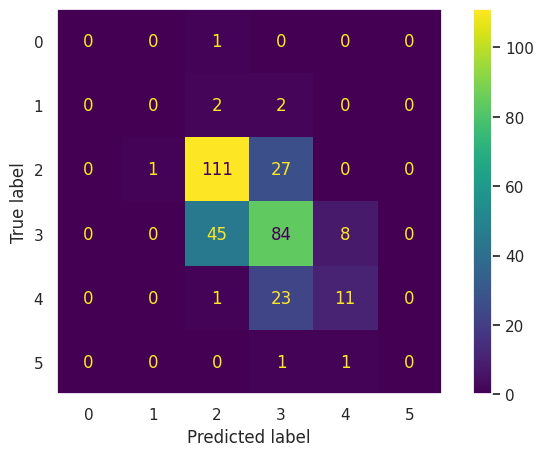


 Test Data: logistic Regression_Classification Report:
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00         4
           5       0.69      0.80      0.74       139
           6       0.61      0.61      0.61       137
           7       0.55      0.31      0.40        35
           8       0.00      0.00      0.00         2

    accuracy                           0.65       318
   macro avg       0.31      0.29      0.29       318
weighted avg       0.63      0.65      0.63       318

Precision is: 0.6857091146489817
Recall is: 0.6477987421383647
f1 score is: 0.6628804610757031
ROC is: 0.776178717088894
Accuracy is: 0.6477987421383647


In [38]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score




print("\n \n Test Data: logistic Regression_Confusion Matrix: \n ")
cm=confusion_matrix(Y_test,Y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.grid(False)
plt.show()

print(f"\n Test Data: logistic Regression_Classification Report:\n {classification_report( Y_test,Y_pred)}")
print(f"Precision is: {precision_score(Y_pred, Y_test,average='weighted')}")
print(f"Recall is: {recall_score(Y_pred, Y_test,average='weighted')}")
print(f"f1 score is: {f1_score(Y_pred, Y_test,average='weighted')}")
print(f"ROC is: {roc_auc_score(Y_test, clf.predict_proba(X_test), multi_class='ovo')}")
print(f"Accuracy is: {accuracy_score(Y_pred, Y_test)}")

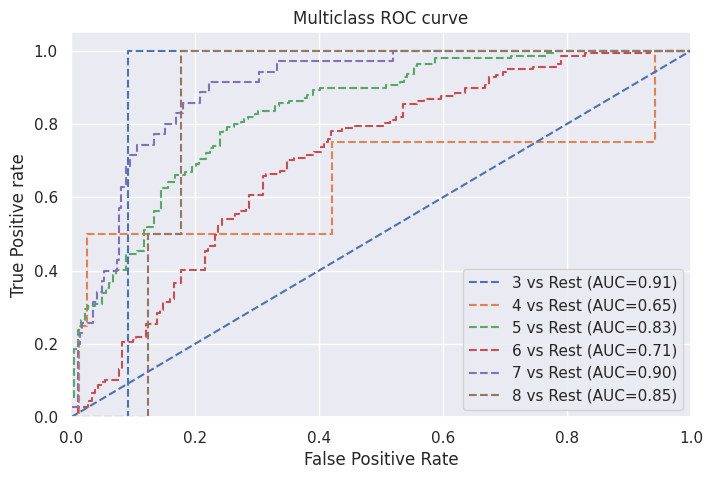

In [39]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve,auc

from sklearn.preprocessing import label_binarize
#binarize the y_values

y_test_binarized=label_binarize(Y_test,classes=np.unique(Y_test))

# roc curve for classes
fpr = {}
tpr = {}
thresh ={}
roc_auc = dict()
classes=np.unique(Y_test)
pred_prob=clf.predict_proba(X_test)
n_class = classes.shape[0]

for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
Classification_Summary(Y_pred,0)

**Feature Importance**

<Axes: ylabel='Feature'>

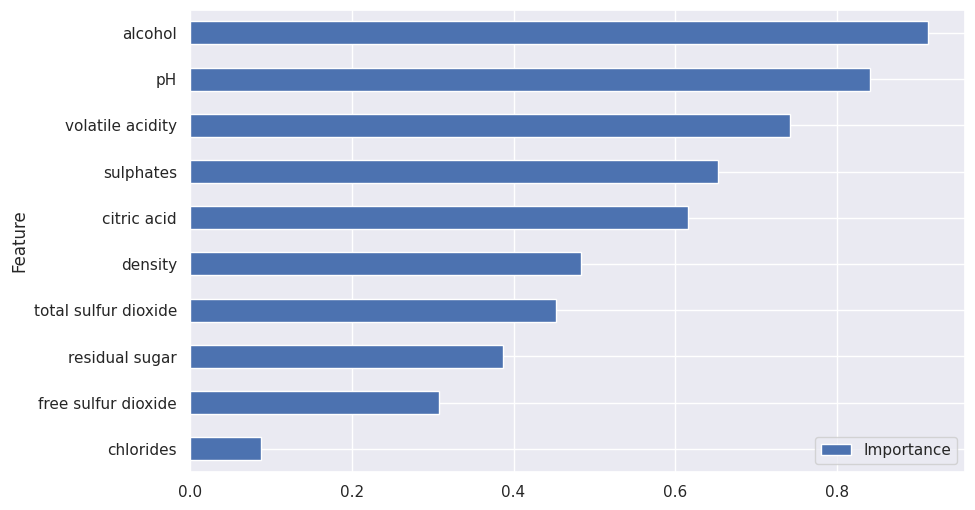

In [40]:
coefficients = clf.best_estimator_._final_estimator.coef_


avg_importance = np.mean(np.abs(coefficients), axis=0)
feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': avg_importance})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

## **Decision Boundary surface for logistic regression**

done 1


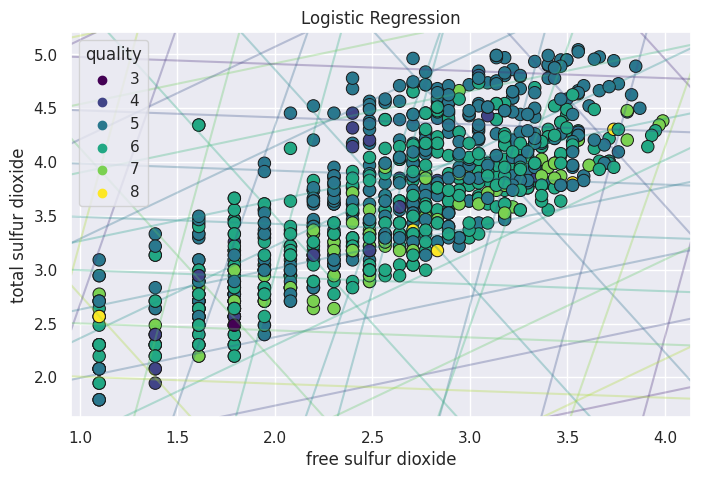

In [41]:
first = X_train.loc[:,"free sulfur dioxide"]
second = X_train.loc[:,"total sulfur dioxide"]
samp = [first , second]
samp = np.transpose(samp)
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(samp)




clf.fit(X_scaled, Y_train)
# Scatter plot using Seaborn

sns.scatterplot(x=first, y=second, hue=y, palette='viridis', marker='o', s=80, edgecolor='k')
plt.title('Logistic Regression')

# Plot decision boundary using Matplotlib
ax = plt.gca()
xlim = ax.get_xlim()
ylim = ax.get_ylim()

xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 100), np.linspace(ylim[0], ylim[1], 100))
print("done 1")
Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])

for i in range(clf.classes_.shape[0]):
    plt.contour(xx, yy, Z[:, i].reshape(xx.shape), cmap='viridis', alpha=0.3)

plt.show()


#**Support Vector Machines(SVM)**

In [42]:
import numpy as np
from sklearn.svm import SVC

# Define the hyperparameter grid
parameters = {
    'classifier__C': [0.1, 1, 10,20],
    'classifier__kernel': ['linear','poly','rbf'],
    'classifier__gamma': ['scale',0.1, 0.01],
}


pipe=Pipeline([('scaler',StandardScaler()),('classifier',SVC(probability=True,random_state=1))])
clf=GridSearchCV(pipe, param_grid=parameters, cv=5,refit=True,scoring='accuracy')
clfb=SVC(probability=True,random_state=1)
clfb.fit(XB_train, YB_train)
clf.fit(X_train, Y_train)

YB_pred=clfb.predict(XB_test)
Y_pred=clf.predict(X_test)

In [43]:
# accuracy score
SVM_Base_accuracy=accuracy_score(YB_pred, YB_test)
SVM_accuracy=accuracy_score(Y_pred, Y_test)
print(f"Base Accuracy : {accuracy_score(YB_pred, YB_test)}")
print(f"Optimized Accuracy : {accuracy_score(Y_pred, Y_test)}")

Base Accuracy : 0.59
Optimized Accuracy : 0.660377358490566



 
 Test Data: SVM_Confusion Matrix: 
 


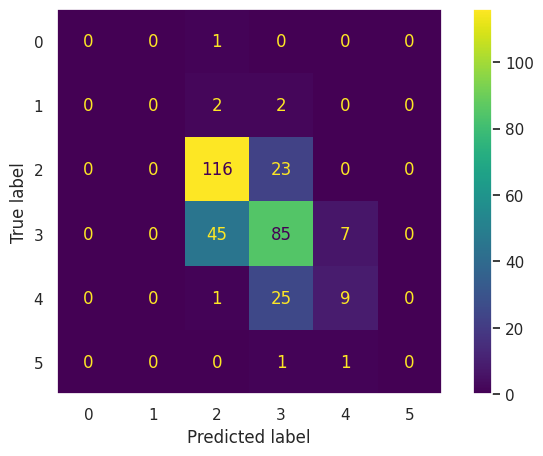


 Test Data: SVM_Classification Report:
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00         4
           5       0.70      0.83      0.76       139
           6       0.62      0.62      0.62       137
           7       0.53      0.26      0.35        35
           8       0.00      0.00      0.00         2

    accuracy                           0.66       318
   macro avg       0.31      0.29      0.29       318
weighted avg       0.63      0.66      0.64       318

Precision is: 0.7121032463579966
Recall is: 0.660377358490566
f1 score is: 0.6807997254869151
ROC is: 0.7011482722060101
Accuracy is: 0.660377358490566


In [44]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

Y_pred=clf.predict(X_test)


print("\n \n Test Data: SVM_Confusion Matrix: \n ")
cm=confusion_matrix(Y_test,Y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.grid(False)
plt.show()

print(f"\n Test Data: SVM_Classification Report:\n {classification_report( Y_test,Y_pred)}")
print(f"Precision is: {precision_score(Y_pred, Y_test,average='weighted')}")
print(f"Recall is: {recall_score(Y_pred, Y_test,average='weighted')}")
print(f"f1 score is: {f1_score(Y_pred, Y_test,average='weighted')}")
print(f"ROC is: {roc_auc_score(Y_test, clf.predict_proba(X_test), multi_class='ovo')}")
print(f"Accuracy is: {accuracy_score(Y_pred, Y_test)}")

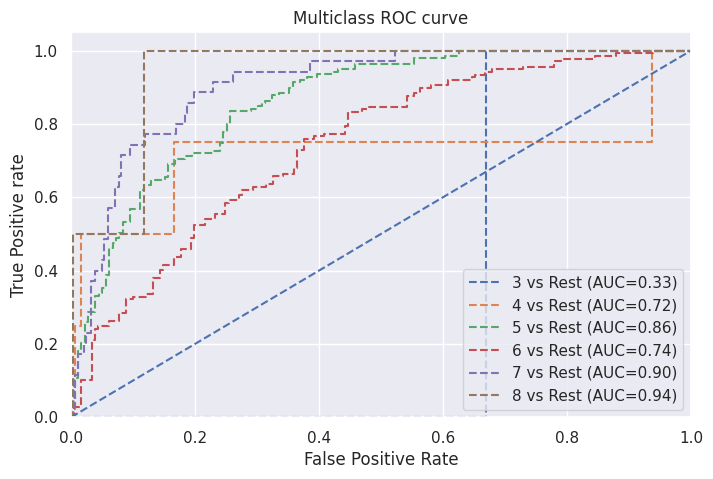

In [45]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve,auc

from sklearn.preprocessing import label_binarize
#binarize the y_values

y_test_binarized=label_binarize(Y_test,classes=np.unique(Y_test))

# roc curve for classes
fpr = {}
tpr = {}
thresh ={}
roc_auc = dict()
classes=np.unique(Y_test)
pred_prob=clf.predict_proba(X_test)
n_class = classes.shape[0]

for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
Classification_Summary(Y_pred,1)

Text(0.5, 1.0, 'Permutation Importance with Standard Deviation')

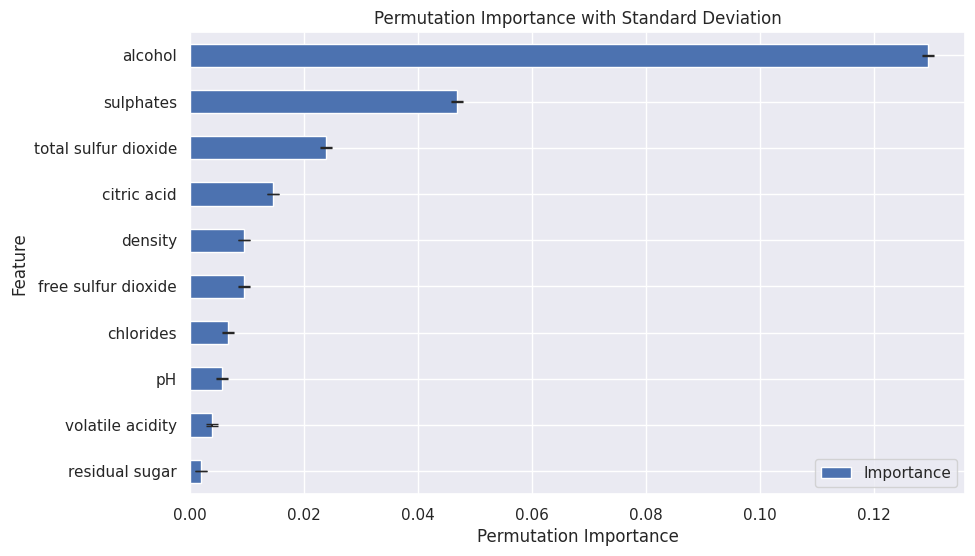

In [46]:
from sklearn.inspection import permutation_importance

result = permutation_importance(clf, X_test, Y_test, n_repeats=10, random_state=42)


feature_importance = pd.DataFrame({'Feature': X.columns,
                                   'Importance': result.importances_mean,
                                   'Standard Deviation': result.importances_std})
feature_importance = feature_importance.sort_values('Importance', ascending=True)


ax = feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6), yerr='Standard Deviation', capsize=4)
ax.set_xlabel('Permutation Importance')
ax.set_title('Permutation Importance with Standard Deviation')

## **Decision Boundary surface for SVM**

done 1


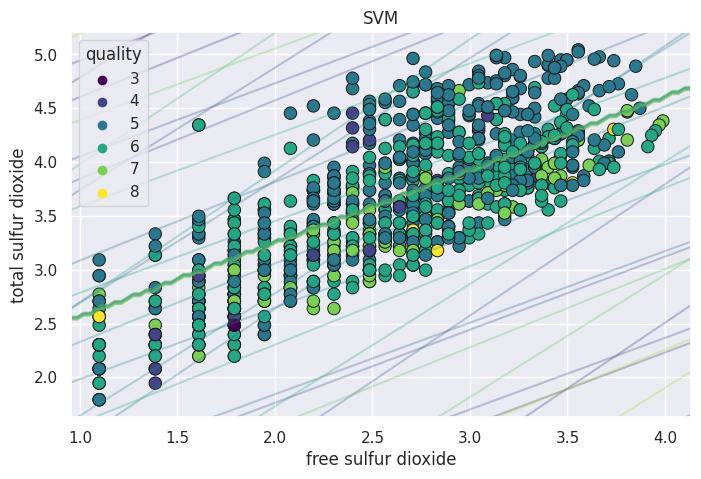

In [47]:
first = X_train.loc[:,"free sulfur dioxide"]
second = X_train.loc[:,"total sulfur dioxide"]
samp = [first , second]
samp = np.transpose(samp)
# Standardize features
scaler = StandardScaler()


# Train an SVM model with RBF kernel

clf.fit(samp, Y_train)
# Scatter plot using Seaborn

sns.scatterplot(x=first, y=second, hue=y, palette='viridis', marker='o', s=80, edgecolor='k')
plt.title('SVM')

# Plot decision boundary using Matplotlib
ax = plt.gca()
xlim = ax.get_xlim()
ylim = ax.get_ylim()

xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 100), np.linspace(ylim[0], ylim[1], 100))
print("done 1")
Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])

for i in range(clf.classes_.shape[0]):
    plt.contour(xx, yy, Z[:, i].reshape(xx.shape), cmap='viridis', alpha=0.3)

plt.show()

## **Random Forest**

In [48]:
from sklearn.ensemble import RandomForestClassifier


parameters = {
  'classifier__n_estimators': [ 10,50,100],
   "classifier__criterion": ["gini"],
    'classifier__max_depth': [None, 10, 20],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}
pipe=Pipeline([('scaler',StandardScaler()),('classifier',RandomForestClassifier(random_state=1))])
clf=GridSearchCV(pipe, param_grid=parameters, cv=5,refit=True,scoring='accuracy')
clfb=RandomForestClassifier(random_state=1)
clfb.fit(XB_train, YB_train)
clf.fit(X_train, Y_train)

YB_pred=clfb.predict(XB_test)
Y_pred=clf.predict(X_test)

In [49]:
# accuracy score
RF_Base_accuracy=accuracy_score(YB_pred, YB_test)
RF_accuracy=accuracy_score(Y_pred, Y_test)
print(f"Base Accuracy : {accuracy_score(YB_pred, YB_test)}")
print(f"Optimized Accuracy : {accuracy_score(Y_pred, Y_test)}")


Base Accuracy : 0.6725
Optimized Accuracy : 0.7547169811320755



 
 Test Data: Random forest_Confusion Matrix: 
 


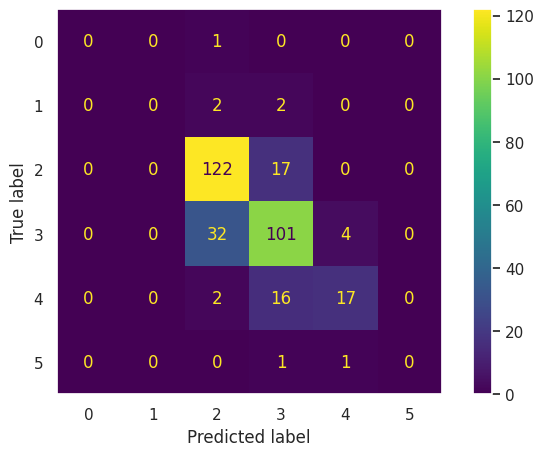


 Test Data: Random Forest_Classification Report:
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00         4
           5       0.77      0.88      0.82       139
           6       0.74      0.74      0.74       137
           7       0.77      0.49      0.60        35
           8       0.00      0.00      0.00         2

    accuracy                           0.75       318
   macro avg       0.38      0.35      0.36       318
weighted avg       0.74      0.75      0.74       318

Precision is: 0.7900618588687002
Recall is: 0.7547169811320755
f1 score is: 0.7682727247818588
ROC is: 0.7554821294163836
Accuracy is: 0.7547169811320755


In [50]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

Y_pred=clf.predict(X_test)


print("\n \n Test Data: Random forest_Confusion Matrix: \n ")
cm=confusion_matrix(Y_test,Y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.grid(False)
plt.show()

print(f"\n Test Data: Random Forest_Classification Report:\n {classification_report( Y_test,Y_pred)}")
print(f"Precision is: {precision_score(Y_pred, Y_test,average='weighted')}")
print(f"Recall is: {recall_score(Y_pred, Y_test,average='weighted')}")
print(f"f1 score is: {f1_score(Y_pred, Y_test,average='weighted')}")
print(f"ROC is: {roc_auc_score(Y_test, clf.predict_proba(X_test), multi_class='ovo')}")
print(f"Accuracy is: {accuracy_score(Y_pred, Y_test)}")

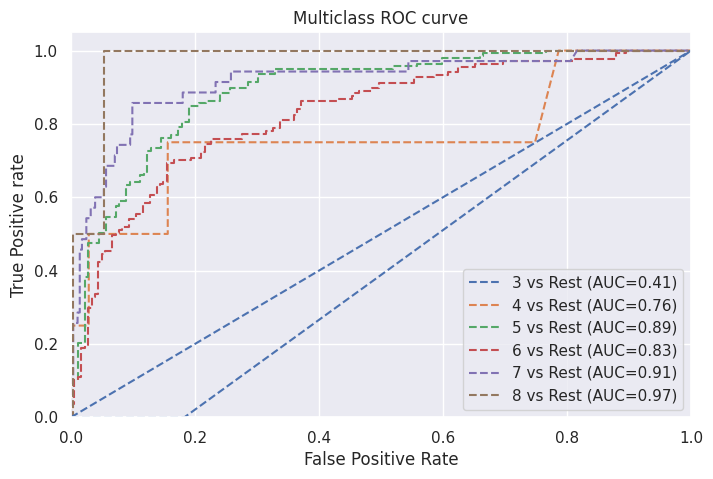

In [51]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve,auc

from sklearn.preprocessing import label_binarize
#binarize the y_values

y_test_binarized=label_binarize(Y_test,classes=np.unique(Y_test))

# roc curve for classes
fpr = {}
tpr = {}
thresh ={}
roc_auc = dict()
classes=np.unique(Y_test)
pred_prob=clf.predict_proba(X_test)
n_class = classes.shape[0]

for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
Classification_Summary(Y_pred,2)

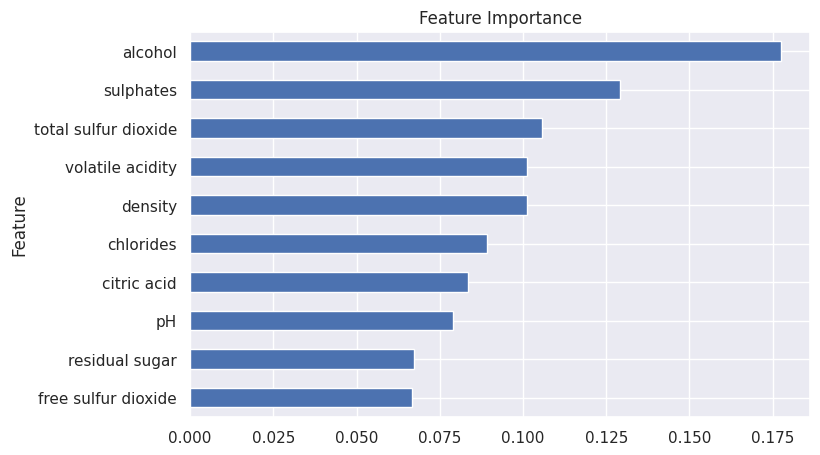

In [52]:
# Get feature names from training data
features = X_train.columns

# Extract importances from model
importances = clf.best_estimator_._final_estimator.feature_importances_

# Create a series with feature names and importances
feat_imp = pd.Series(importances,index=features).sort_values()

# Plot 10 most important features
feat_imp.tail(10).plot(kind="barh")
plt.xlabel("")
plt.ylabel("Feature")
plt.title("Feature Importance");

## **Decision Boundary surface for Random forest**

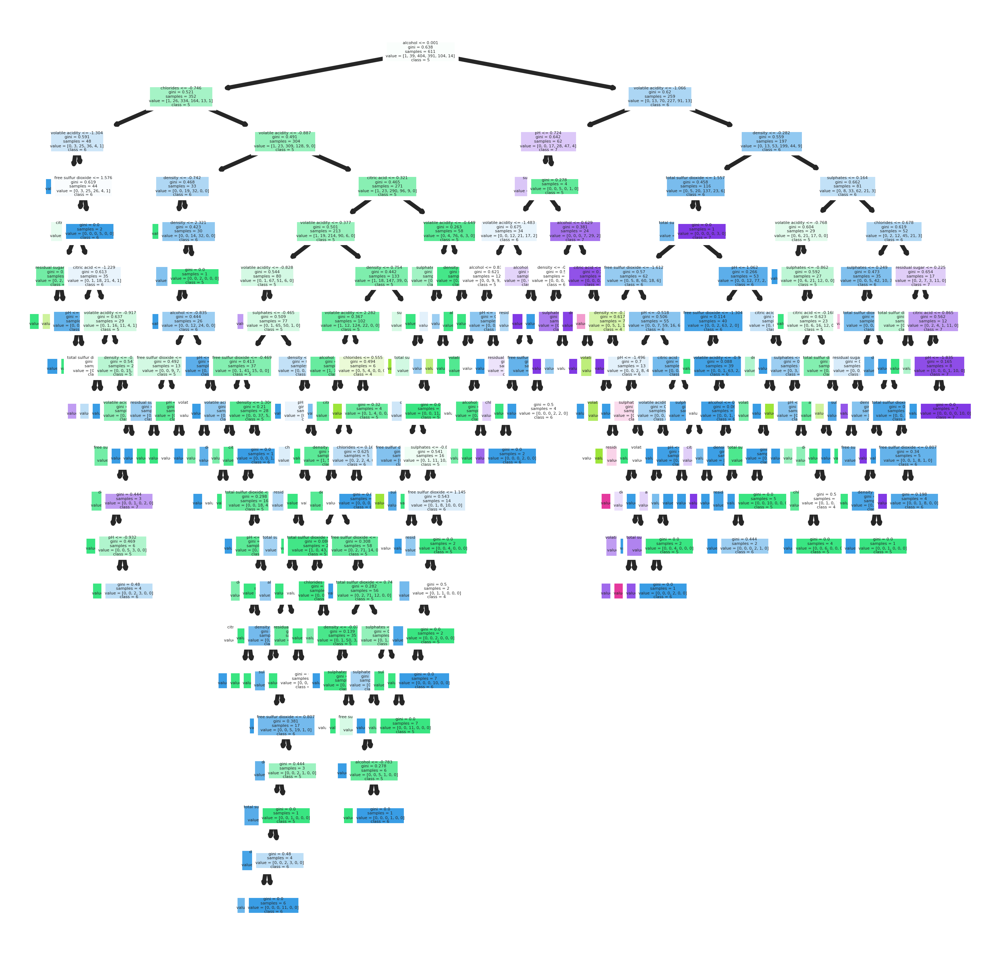

In [53]:
from sklearn import tree
fn=X_train.columns
cn=["3","4","5","6","7","8"]
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(clf.best_estimator_._final_estimator.estimators_[0],
               feature_names = fn,
               class_names=cn,
               filled = True);

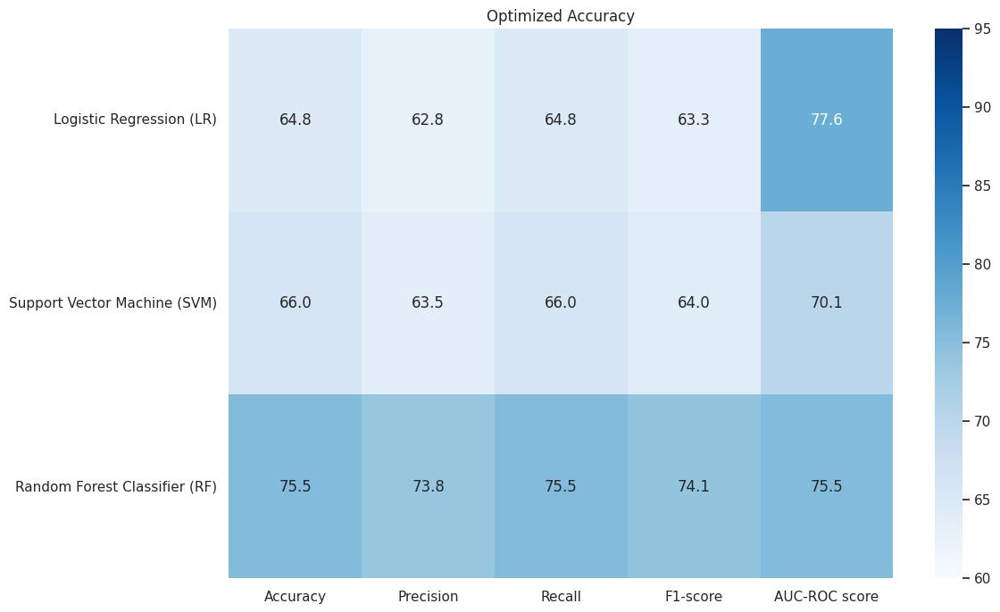

In [54]:

plt.figure(figsize=[12,8])
sns.set(font_scale = 1)
sns.heatmap(Evaluation_Results, annot=True, vmin=60, vmax=95, cmap='Blues', fmt='.1f')
plt.title("Optimized Accuracy")
plt.show()


In [55]:

print(f"Logistic Regression: Base accuracy-{round(LR_Base_accuracy,3)*100}%, Optimal accuracy-{round(LR_accuracy,3)*100}%")
print(f"SVM: Base accuracy-{round(SVM_Base_accuracy,3)*100}%, Optimal accuracy-{round(SVM_accuracy,3)*100}%")
print(f"Random Forest: Base accuracy-{round(RF_Base_accuracy,3)*100}%, Optimal accuracy-{round(RF_accuracy,3)*100}%")

Logistic Regression: Base accuracy-60.0%, Optimal accuracy-64.8%
SVM: Base accuracy-59.0%, Optimal accuracy-66.0%
Random Forest: Base accuracy-67.2%, Optimal accuracy-75.5%


**From the analysis there is an increase in accruracy of 7 to 8% compared to the baseline models**

## **Analysis**
Following a comprehensive analysis, the dataset originally consisted of 1599 sample, after preprocessing 1.3% of the  data samples were dropped. Fixed acidity feature was removed using feature selection process as its high multicollinearity generates high variance of the coefficients and hence, the coefficient estimates corresponding to those interrelated explanatory variables will not be accurate. The examination of feature importance unveils that alcohol and sulphates play pivotal roles in the classification process, exerting significant influence, while residual sugar and free sulfur dioxide emerges with minimal impact on the classification outcomes. Model Performance enhancing steps carried out in this analysis are:



o	Feature engineering (log-normal transformation)

o	Outlier Removal (IQR Method)

o	Feature selection (Pearson Coefficients)

o	Standardization

o	Grid search CV

Upon model evaluation, it is evident that the Random Forest outperforms other models, demonstrating superior accuracy, precision, recall, F1 score. This could be attributed to its effective ensembling technique. In contrast, SVM, despite its kernel trick, struggles to identify patterns, possibly due to the complexity of the nonlinear dataset. Logistic regression, with its limitation in handling nonlinearly separable data, performs least effectively in these scenarios. On the contrary, on analyzing ROC Curve logistic regression demonstrates a superior AUC-ROC score for class 3, attributed to its capability to assign class weights in the context of an imbalanced dataset. This distinctive feature allows logistic regression to address class imbalance despite low accuracy.


# **Conclusion**

•	The Random Forest model emerged as the most effective for this specific task of wine quality prediction. The ensemble of decision trees proved to be quite good at extracting non-linear patterns with accuracy of 75%.

•	Alcohol and sulphates play pivotal roles in the classification process whereas residual sugar has minimal impact.

•	Logistic Regression with accuracy of 65% did provide some valuable insights about feature importance, and had very good ROC score handling specific minor class effectively but overall, it simply was not as appropriate as Random Forest in the context of accuracy and handling imbalance data.

•	While SVM with accurcay of 66% also lagged in performance, further exploration of fine-tuning of parameters and experimenting with different kernels could potentially enhance its predictive capabilities.

•	Moreover, addressing imbalanced data and incorporating more data could be explored in future iterations to potentially improve model generalization
